# Classifieurs connus - ResNet50

## Objectif
L'objectif de ce notebook est de tester l'architecture de CNN ResNet50 sur le jeu de données de l'étude.

## Présentation de ResNet50

ResNet50 est un réseau de neurones convolutionnels (CNN) profond qui a remporté de nombreux prix dans les compétitions de classification d'images. La particularité de ResNet50 est qu'il utilise une architecture de saut de connexion (skip connection) pour résoudre le problème de la disparition du gradient dans les réseaux de neurones profonds.

Concrètement, la plupart des réseaux de neurones profonds utilisent des couches de convolution pour extraire des caractéristiques à partir des images d'entrée. Ces caractéristiques sont ensuite passées à travers des couches de neurones entièrement connectées pour produire la sortie finale. Cependant, lors de la propagation vers l'arrière du gradient pour mettre à jour les poids, le gradient peut diminuer considérablement à travers de nombreuses couches de convolution. Ce phénomène est appelé la disparition du gradient.

Pour résoudre ce problème, ResNet50 utilise des connexions sautées qui permettent de transmettre directement l'information d'entrée à travers les couches de convolution. De cette façon, l'erreur peut être propagée plus facilement à travers les couches du réseau.

ResNet50 est couramment utilisé pour la classification d'images, la reconnaissance d'objets, la détection d'objets et la segmentation d'images. Il est souvent pré-entraîné sur des ensembles de données massifs tels qu'ImageNet et peut être fine-tuné pour des tâches spécifiques avec des ensembles de données plus petits.

![image](https://cdn-images-1.medium.com/fit/t/1600/480/0*tH9evuOFqk8F41FG.png)

ResNet50 est une architecture de réseau de neurones convolutifs qui utilise des blocs résiduels pour améliorer la performance de la rétropropagation du gradient lors de l'entraînement en profondeur. L'architecture se compose de 50 couches et utilise des filtres de taille 7x7, 3x3 et 1x1 pour extraire des caractéristiques à différentes échelles spatiales. La sortie du réseau est ensuite alimentée dans un classificateur entièrement connecté pour effectuer la prédiction finale. ResNet50 est largement utilisé dans les tâches de vision par ordinateur, telles que la classification d'images, la détection d'objets et la segmentation sémantique.

## Hypothèses
Les hypothèses quant aux résultats attendus sont les suivants :
- Une précision équivalente ou plus haute que celle du CNN du template
- Un temps d'entraînement plus important que celui du CNN

## Etapes de la démarche
1. Remplacer la méthode create_model() en utilisant l'implémentation ResNet50 de Keras
2. Tester le modèle sur le jeu de données
3. Calculer les métriques de performance
4. Comparer les résultats avec les résultats du CNN

## Notes sur l'implémentation
Ayant rencontré des problèmes de mémoire lors de l'entrainement, les changements suivants ont été apportés :
- Le batch size a été réduit de 100 à 64
- La taille des images générées a été réduite de 256x256 à 128x128

## Conclusion
Les résultats obtenus sont les suivants :
- La précision est quasi-équivalente (0.91) à celle du CNN (0.92)
- Le temps d'entrainement est légèrement plus court (130ms/step) que celui du CNN (150ms/step)

Selon ces observations, on peut en déduire que le modèle ResNet50 est fiable pour notre cas d'usage. Une hypothèse d'ouverture serait de dire que le modèle est probablement plus performant que le CNN de référence sur des images en couleur (RGB) de plus grande taille et pour prédire sur plusieurs classes (ici, on a du adapter le modèdle ResNet à une sortie binaire avec des couches cachées custom).

In [1]:
# Check that GPU is used
import tensorflow as tf
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [2]:
from PIL import Image
import os
import numpy as np

# Define the folders where your data is stored
train_folder = 'train'
test_folder = 'test'
val_folder = 'val'

# Define the subfolders within each folder where the images are stored
subfolders = ['NORMAL', 'PNEUMONIA']

# Define the size of the images you want to resize your images to
img_width, img_height = 128, 128 # Function to load and resize images from a folder

In [3]:
# Function to load and resize images from a folder
def load_images_from_folder(folder, limit_per_subfolder=None):
    X = []
    y = []
    for subfolder in subfolders:
        folder_path = os.path.join(folder, subfolder)
        if limit_per_subfolder:
            # Get amount of random filenames from the folder
            filenames = np.random.choice(os.listdir(folder_path), limit_per_subfolder, replace=False)
        else:
            filenames = os.listdir(folder_path)
        for filename in filenames:
            img_path = os.path.join(folder_path, filename)
            img = Image.open(img_path)

            # Resize the image to the desired size
            img = img.resize((img_width, img_height))

            # Convert RGB image to grayscale
            img = img.convert('L')

            # Convert the image to a NumPy array and append it to X
            img = np.array(img)
            X.append(img)

            # Append the corresponding label to y
            y.append(subfolders.index(subfolder))

    X = np.array(X)
    y = np.array(y)
    return X, y

In [4]:
# Generate augmented for the training set
from common.data_augmentation import generate_augmented_images
generate_augmented_images(train_folder, 'NORMAL', image_size=(img_width, img_height))
generate_augmented_images(train_folder, 'PNEUMONIA', image_size=(img_width, img_height))

Found 1341 images belonging to 1 classes.
Additional count of images to generate: 0
Given NORMAL count: 1341
Augmented NORMAL count: 5000
Found 3874 images belonging to 1 classes.
Additional count of images to generate: 0
Given PNEUMONIA count: 3874
Augmented PNEUMONIA count: 5000


In [5]:
# Load the training data
# Get min value between the number of normal images and the number of pneumonia images
train_folder = f"{train_folder}_augmented"
min_images = min(len(os.listdir(os.path.join(train_folder, subfolders[0]))), len(os.listdir(os.path.join(train_folder, subfolders[1]))))
X_train, y_train = load_images_from_folder(train_folder, min_images)

# Load the test data
X_test, y_test = load_images_from_folder(test_folder)

# Load the validation data
X_val, y_val = load_images_from_folder(val_folder)

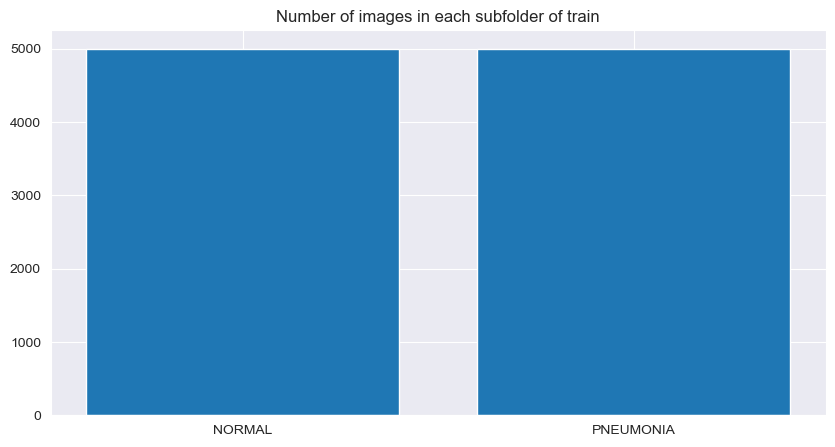

In [6]:
# Make a matplot figure to show how many images are in each subfolder of train
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 5))
plt.bar(subfolders, [len(os.listdir(os.path.join(train_folder, subfolder))) for subfolder in subfolders])
plt.title('Number of images in each subfolder of train')
plt.show()

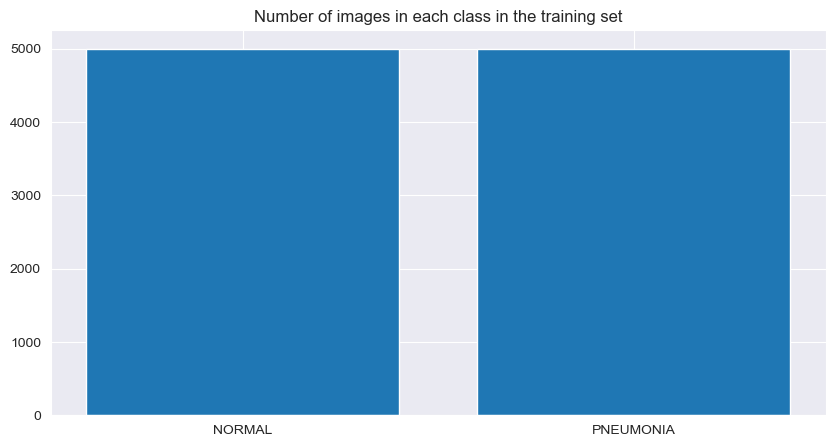

In [7]:
# Make a matplot figure to show how many images if each class in the training set
plt.figure(figsize=(10, 5))
plt.bar(subfolders, [len(y_train[y_train == i]) for i in range(len(subfolders))])
plt.title('Number of images in each class in the training set')
plt.show()

In [8]:
# Normalize the pixel values to be between 0 and 1
X_train = X_train.reshape(len(X_train), img_width, img_height)
X_test = X_test.reshape(len(X_test), img_width, img_height)
X_val = X_val.reshape(len(X_val), img_width, img_height)

X_train = np.repeat(X_train[..., np.newaxis], 3, -1)
X_test = np.repeat(X_test[..., np.newaxis], 3, -1)
X_val = np.repeat(X_val[..., np.newaxis], 3, -1)

(128, 128, 3)


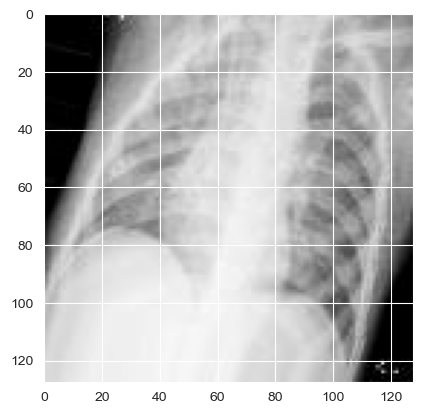

In [9]:
single_image = X_train[np.random.randint(len(X_train))]
print(single_image.shape)
plt.imshow(single_image)

In [10]:
# Define model metrics
from keras.metrics import AUC

metrics = [
    "accuracy",
    AUC(name='auc')
]

## Implémentation du modèle ResNet50
On utilise le modèle ResNet50 pré-entrainé sur ImageNet et on ajoute des couches cachées custom pour prédire sur notre dataset.
En commentaires, on remarque qu'il est possible de geler les poids du modèle ResNet50 pour ne pas les réentrainer. Cependant, on a remarqué que le modèle était plus performant sans cette étape car le modèle a été entrainé pour un cas de classification avec plusieurs sorties possibles.

In [11]:
from keras import Model
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Flatten, Dense, Dropout

# Define the model architecture
def create_model():
    resnet_model = ResNet50(
        include_top=False,
        weights=None,
        input_tensor=None,
        input_shape=(img_width, img_height, 3),
        pooling='max',
        classes=1
    )

    # Make all layers from ResNet model untrainable by freezing weights
    # for layer in resnet_model.layers:
    #     layer.trainable = False

    # Add your own Dense layers
    x = resnet_model.output
    x = Flatten()(x)
    x = Dense(256, activation='relu', name='custom_dense_1')(x)
    x = Dropout(0.5)(x)
    x = Dense(128, activation='relu', name='custom_dense_2')(x)
    x = Dropout(0.5)(x)
    predictions = Dense(1, activation='sigmoid', name='custom_dense_3')(x)

    # Create the model
    model = Model(inputs=resnet_model.input, outputs=predictions)

    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=metrics)

    return model

In [12]:
from tensorflow.keras.callbacks import EarlyStopping
early_stop = EarlyStopping(monitor='loss', patience=3, restore_best_weights=True)

In [14]:
# Cross validation
from sklearn.model_selection import KFold
from keras.preprocessing.image import ImageDataGenerator
from keras.applications.resnet import preprocess_input

# Define the number of folds for cross-validation
n_splits = 10
epochs = 7
batch_size = 64

# Initialize KFold with the number of folds
kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

# Define lists to store the evaluation scores for each fold
accuracy_scores = []
histories = []
models = []

# Iterate through each fold and train/evaluate the model
for train_idx, val_idx in kf.split(X_train, y_train):
    # Split the data into training and validation sets for this fold
    X_train_fold, y_train_fold = X_train[train_idx], y_train[train_idx]
    X_val_fold, y_val_fold = X_train[val_idx], y_train[val_idx]

    # Create an instance of ImageDataGenerator to generate your image data
    # We use the preprocess_input function from ResNet50 to preprocess our images
    datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

    # Create generators for training and validation data
    train_generator = datagen.flow(x=X_train_fold, y=y_train_fold, batch_size=batch_size)
    valid_generator = datagen.flow(x=X_val_fold, y=y_val_fold, batch_size=batch_size)

    # Create instance of the model for this fold and train it
    model = create_model()

    # Train your model on the training data for this fold
    history = model.fit(train_generator, validation_data=valid_generator, epochs=epochs, verbose=1, callbacks=[early_stop])
    histories.append(history.history)

    models.append(model)


Epoch 1/7
141/141 [==============================] - 25s 140ms/step - loss: 1.5239 - accuracy: 0.5387 - auc: 0.5958 - val_loss: 0.7305 - val_accuracy: 0.5080 - val_auc: 0.6057
Epoch 2/7
141/141 [==============================] - 19s 132ms/step - loss: 0.4278 - accuracy: 0.8122 - auc: 0.8866 - val_loss: 2.6240 - val_accuracy: 0.5070 - val_auc: 0.7570
Epoch 3/7
141/141 [==============================] - 19s 132ms/step - loss: 0.3196 - accuracy: 0.8639 - auc: 0.9422 - val_loss: 0.2847 - val_accuracy: 0.9050 - val_auc: 0.9588
Epoch 4/7
141/141 [==============================] - 19s 132ms/step - loss: 0.2568 - accuracy: 0.9061 - auc: 0.9637 - val_loss: 0.9189 - val_accuracy: 0.7160 - val_auc: 0.9163
Epoch 5/7
141/141 [==============================] - 19s 132ms/step - loss: 0.2090 - accuracy: 0.9221 - auc: 0.9741 - val_loss: 0.3117 - val_accuracy: 0.8960 - val_auc: 0.9771
Epoch 6/7
141/141 [==============================] - 19s 133ms/step - loss: 0.1803 - accuracy: 0.9317 - auc: 0.9802 - va

In [15]:
# Get accuracy scores for each fold (train and validation)
loss = []
acc = []
val_loss = []
val_acc = []

for history in histories:
    loss.append(np.mean(history["loss"]))
    acc.append(np.mean(history["accuracy"]))
    val_loss.append(np.mean(history["val_loss"]))
    val_acc.append(np.mean(history["val_accuracy"]))

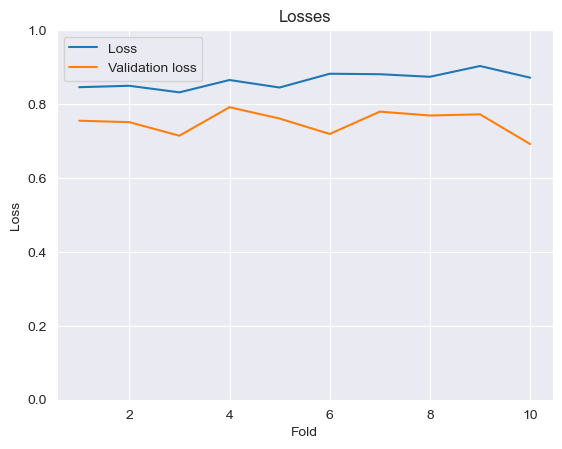

In [16]:
# Plot loss and validation loss per fold
import matplotlib.pyplot as plt
plt.title('Losses')
plt.plot(range(1, len(acc)+1), acc, label='Loss')
plt.plot(range(1, len(val_acc)+1), val_acc, label='Validation loss')
plt.ylim(0.0, 1.0)
plt.xlabel('Fold')
plt.ylabel('Loss')
plt.legend()
plt.show()

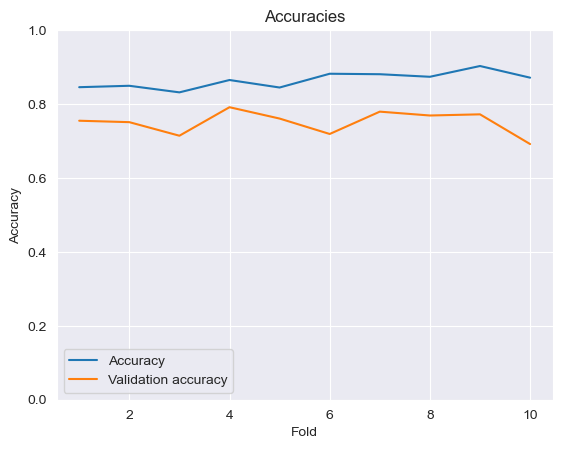

In [17]:
# Plot accuracies and validation accuracies per fold
import matplotlib.pyplot as plt
plt.title('Accuracies')
plt.plot(range(1, len(acc)+1), acc, label='Accuracy')
plt.plot(range(1, len(val_acc)+1), val_acc, label='Validation accuracy')
plt.ylim(0.0, 1.0)
plt.xlabel('Fold')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [17]:
# Train a final model with same parameters and save it
train_generator = datagen.flow(x=X_train, y=y_train, batch_size=batch_size)
valid_generator = datagen.flow(x=X_val, y=y_val, batch_size=batch_size)
model = create_model()
history = model.fit(train_generator, validation_data=valid_generator, epochs=epochs, verbose=1, callbacks=[early_stop])
model.save('resnet50.h5')

Epoch 1/7
157/157 [==============================] - 25s 134ms/step - loss: 1.2711 - accuracy: 0.6079 - auc: 0.6376 - val_loss: 1.1257 - val_accuracy: 0.5000 - val_auc: 0.4844
Epoch 2/7
157/157 [==============================] - 20s 130ms/step - loss: 0.3260 - accuracy: 0.8776 - auc: 0.9416 - val_loss: 2.2351 - val_accuracy: 0.5000 - val_auc: 0.7500
Epoch 3/7
157/157 [==============================] - 20s 129ms/step - loss: 0.2393 - accuracy: 0.9088 - auc: 0.9666 - val_loss: 0.4924 - val_accuracy: 0.8125 - val_auc: 0.8828
Epoch 4/7
157/157 [==============================] - 20s 129ms/step - loss: 0.2299 - accuracy: 0.9104 - auc: 0.9696 - val_loss: 0.5096 - val_accuracy: 0.7500 - val_auc: 0.9219
Epoch 5/7
157/157 [==============================] - 20s 129ms/step - loss: 0.1939 - accuracy: 0.9213 - auc: 0.9772 - val_loss: 0.3737 - val_accuracy: 0.7500 - val_auc: 0.9844
Epoch 6/7
157/157 [==============================] - 20s 129ms/step - loss: 0.1977 - accuracy: 0.9224 - auc: 0.9762 - va

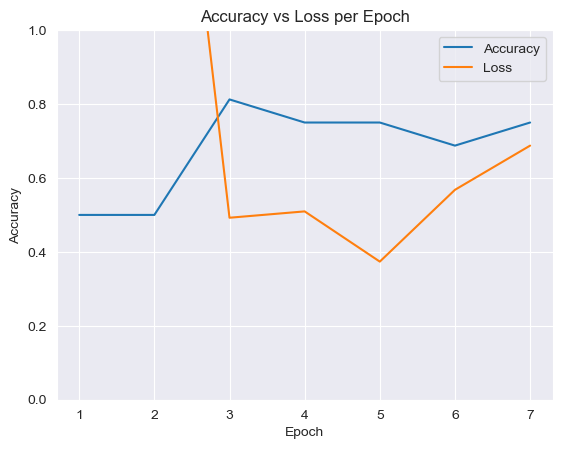

In [18]:
# Plot val accuracy and val loss of the trained model
import matplotlib.pyplot as plt
plt.title('Accuracy vs Loss per Epoch')
plt.plot(range(1, len(history.history["val_accuracy"])+1), history.history["val_accuracy"], label='Accuracy')
plt.plot(range(1, len(history.history["val_loss"])+1), history.history["val_loss"], label='Loss')
plt.ylim(0.0, 1.0)
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [19]:
# Make predictions on the test set
X_test_preprocessed = preprocess_input(X_test)
y_pred_test = model.predict(X_test_preprocessed)
y_pred_test = np.where(y_pred_test >= 0.5, 1, 0)

20/20 [==============================] - 1s 17ms/step


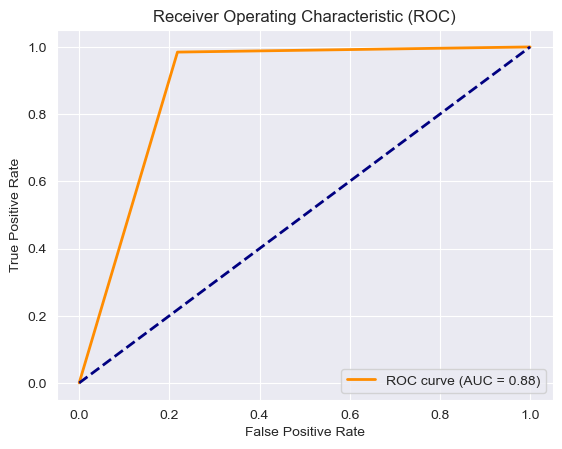

In [20]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Compute ROC curve and AUC score for the predictions
fpr, tpr, thresholds = roc_curve(y_test, y_pred_test)
roc_auc = auc(fpr, tpr)

# Plot ROC curve and show AUC score on the plot
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

In [21]:
from sklearn.metrics import confusion_matrix
# Compute the confusion matrix for test set
cm = confusion_matrix(y_test, y_pred_test.flatten())
print(cm)

[[183  51]
 [  6 384]]


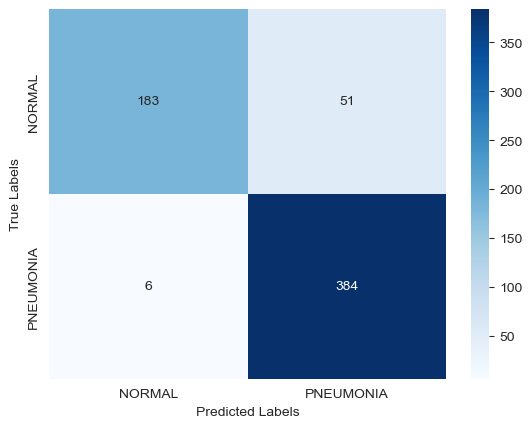

In [22]:
# Plot the confusion matrix
class_names = subfolders
import seaborn as sns
sns.heatmap(cm, annot=True, fmt='g', cmap="Blues", xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

On remarque plus de faux positifs que de faux négatifs, ce qui est plutôt rassurant dans notre cas d'étude. L'inverse aurait pu être comprometant sur la pertinence de notre modèle.

In [23]:
# Compute the classification report for test set
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred_test, target_names=class_names))

              precision    recall  f1-score   support

      NORMAL       0.97      0.78      0.87       234
   PNEUMONIA       0.88      0.98      0.93       390

    accuracy                           0.91       624
   macro avg       0.93      0.88      0.90       624
weighted avg       0.91      0.91      0.91       624



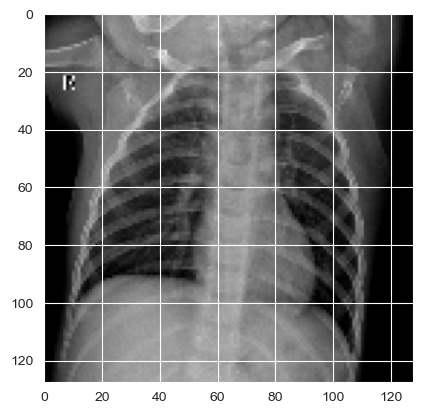

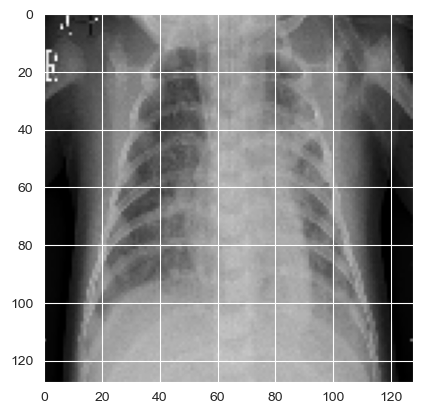

In [24]:
# Heatmaps and Grad-CAM
from common.cam import get_img_array
import cv2
import matplotlib.pyplot as plt 

images = [
    {
        "path": "./val/NORMAL/NORMAL2-IM-1442-0001.jpeg"
    },
    {
        "path": "./val/PNEUMONIA/person1946_bacteria_4874.jpeg"
    }
]

for image in images:
    image_temp = cv2.imread(image["path"])
    image_temp = cv2.cvtColor(image_temp, cv2.COLOR_RGB2GRAY)
    image_temp = cv2.resize(image_temp, (img_width, img_height))

    plt.imshow(image_temp, cmap=plt.cm.gray)
    plt.show()

    # Image preprocessing
    image["array"] = get_img_array(image["path"], size=(img_width, img_height), grayscale=False)
    image["array"] = preprocess_input(image["array"])

In [25]:
# Remove last layer's softmax
model.layers[-1].activation = None

# import os
# os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"

In [26]:
# Print model summary to get last max pooling layer name
print(model.summary())

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 134, 134, 3)  0           ['input_3[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 64, 64, 64)   9472        ['conv1_pad[0][0]']              
                                                                                                  
 conv1_bn (BatchNormalization)  (None, 64, 64, 64)   256         ['conv1_conv[0][0]']       

In [27]:
# Select last conv layer
last_conv_layer_name = "conv5_block3_out"

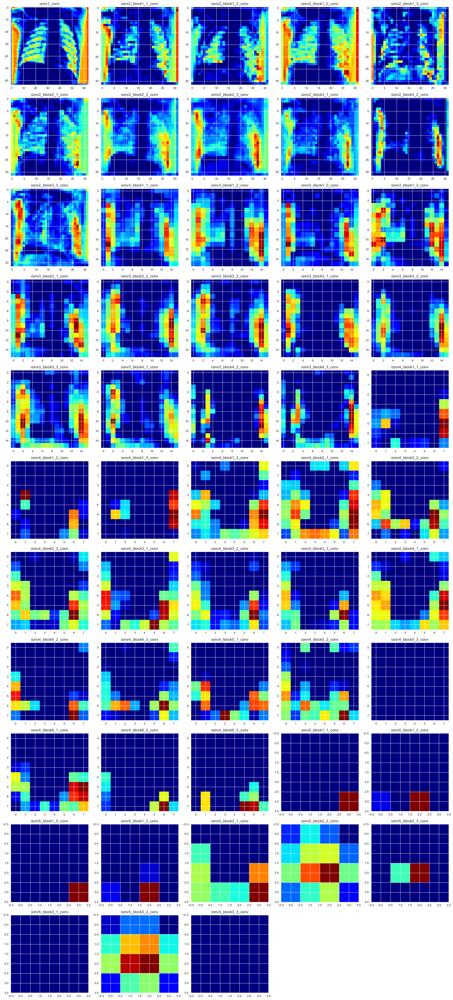

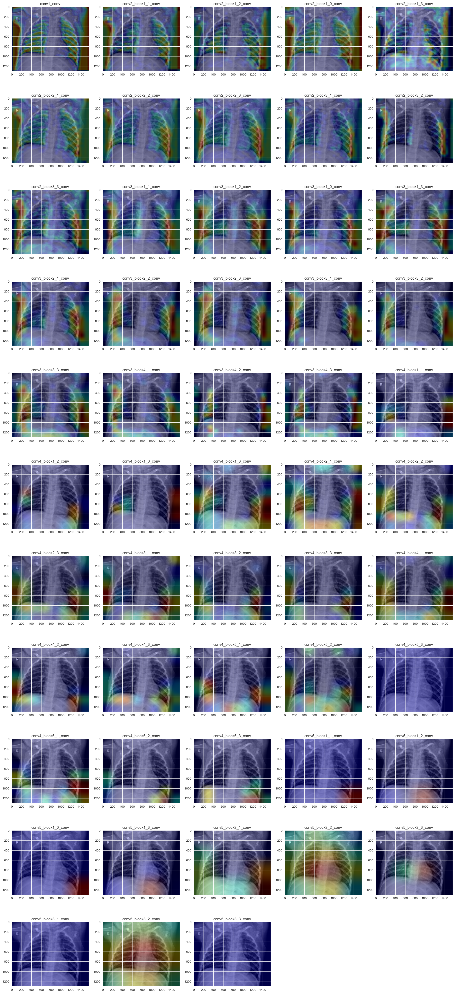

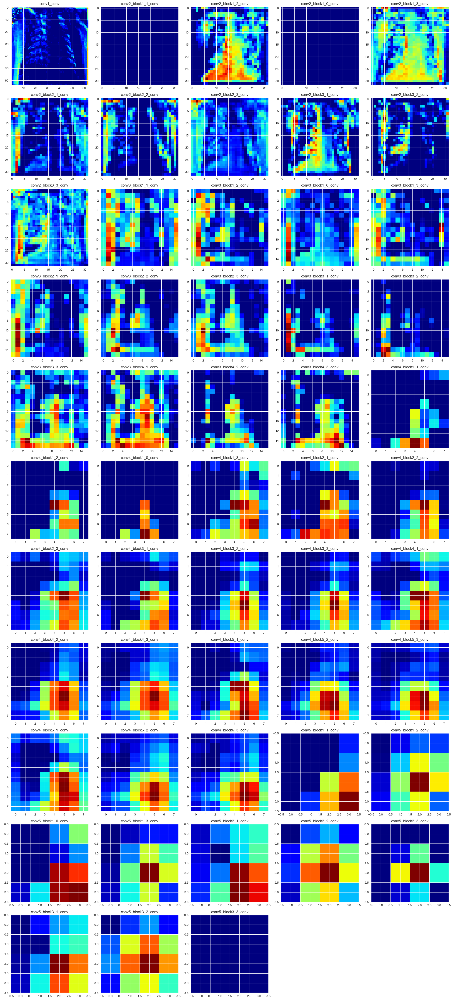

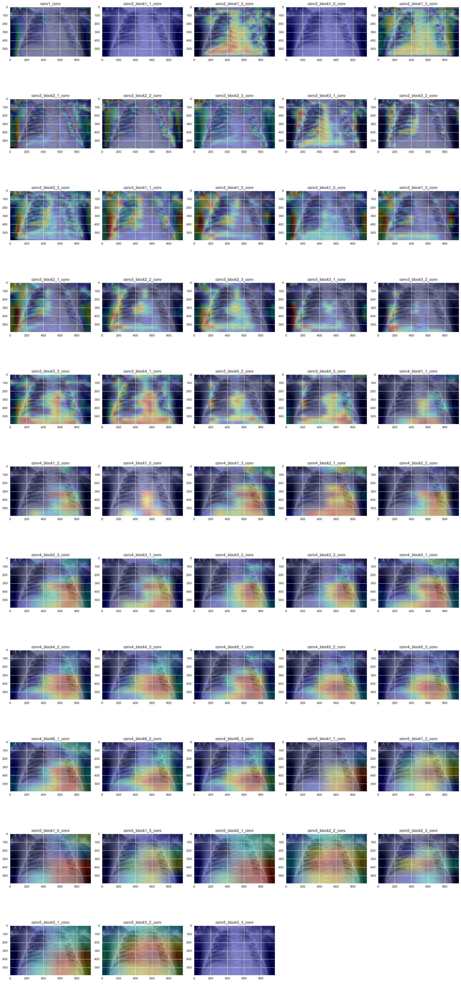

In [28]:
from common.cam import make_gradcam_heatmap, display_heatmaps

for image in images:
    heatmaps = []
    for layer in model.layers[:model.layers.index(model.get_layer(last_conv_layer_name)) + 1]:
        if "_conv" in layer.name:
            heatmap = make_gradcam_heatmap(image["array"], model, layer.name)
            heatmaps.append({
                "layer_name": layer.name,
                "image": heatmap
            })

    # Display heatmaps from all layers until the last max pooling layer
    display_heatmaps(image["path"], heatmaps)

    # Display the chosen image superimposed with heatmaps of each layer until the last max pooling layer
    display_heatmaps(image["path"], heatmaps, True)

In [31]:
# Predict
for image in images:
    pred = model.predict(image["array"])
    # Round the probabilities to get the class label
    pred = np.where(pred >= 0.5, 1, 0)
    print(pred)
    # Display predicted class
    print("Predicted class: {}".format(subfolders[int(pred[0][0])]))

1/1 [==============================] - 0s 21ms/step
[[0]]
Predicted class: NORMAL
1/1 [==============================] - 0s 15ms/step
[[1]]
Predicted class: PNEUMONIA
